# Supply Chain Analytics & Modeling

In this supply chain analytics analysis, we faced the challenge of a small dataset with 100 rows and 24 columns. During the Exploratory Data Analysis phase, we performed quality control checks, assessed supply chain risks, conducted Inventory Optimization using the Economic Order Quantity (EOQ) method, analyzed customer segmentation, and explored lead time optimization. However, in the modeling phase, LightGBM and RNN models proved unsuitable for this dataset, yielding unsatisfactory results. Therefore, we recommend using a larger dataset or considering alternatives such as linear regression, decision trees, or random forests for better cost optimization and demand forecasting outcomes.

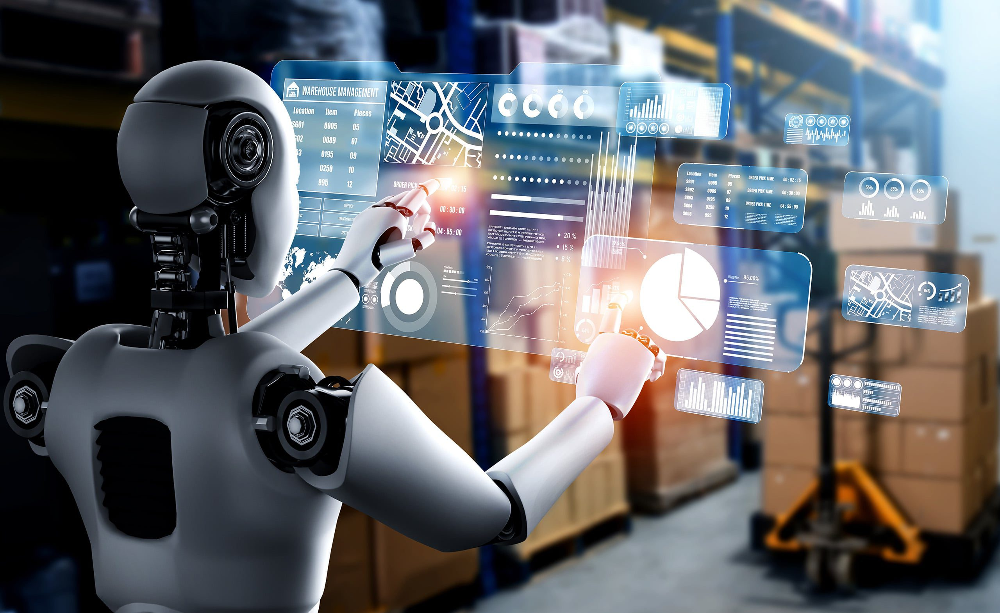

In [11]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

supply_data = pd.read_csv("supply_chain_data.csv")

In [2]:
supply_data.head()

,Product type,SKU,Price,Availability,Number of products sold,Revenue generated,Customer demographics,Stock levels,Lead times,Order quantities,...,Location,Lead time,Production volumes,Manufacturing lead time,Manufacturing costs,Inspection results,Defect rates,Transportation modes,Routes,Costs
0,haircare,SKU0,69.808006,55,802,8661.996792,Non-binary,58,7,96,...,Mumbai,29,215,29,46.279879,Pending,0.226410,Road,Route B,187.752075
1,skincare,SKU1,14.843523,95,736,7460.900065,Female,53,30,37,...,Mumbai,23,517,30,33.616769,Pending,4.854068,Road,Route B,503.065579
2,haircare,SKU2,11.319683,34,8,9577.749626,Unknown,1,10,88,...,Mumbai,12,971,27,30.688019,Pending,4.580593,Air,Route C,141.920282
3,skincare,SKU3,61.163343,68,83,7766.836426,Non-binary,23,13,59,...,Kolkata,24,937,18,35.624741,Fail,4.746649,Rail,Route A,254.776159
4,skincare,SKU4,4.805496,26,871,2686.505152,Non-binary,5,3,56,...,Delhi,5,414,3,92.065161,Fail,3.145580,Air,Route A,923.440632


In [3]:
supply_data.shape

(100, 24)

In [4]:
supply_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Product type             100 non-null    object 
 1   SKU                      100 non-null    object 
 2   Price                    100 non-null    float64
 3   Availability             100 non-null    int64  
 4   Number of products sold  100 non-null    int64  
 5   Revenue generated        100 non-null    float64
 6   Customer demographics    100 non-null    object 
 7   Stock levels             100 non-null    int64  
 8   Lead times               100 non-null    int64  
 9   Order quantities         100 non-null    int64  
 10  Shipping times           100 non-null    int64  
 11  Shipping carriers        100 non-null    object 
 12  Shipping costs           100 non-null    float64
 13  Supplier name            100 non-null    object 
 14  Location                 10

### Feature explanation

Product Type: The type of product associated with specific data in the supply chain.

SKU (Stock Keeping Unit): Unique code used to identify a particular product.

Price: The price of the product or item in the supply chain.

Availability: Information about product availability.

Number of Products Sold: The number of products that have been sold in a certain time period.

Revenue Generated: Total revenue generated from product sales in a certain time period.

Customer demographics: Information about customer characteristics, such as age, gender, geographic location, etc.

Stock Levels: The number of products still available in stock at any given time.

Lead Times: The time required to order or receive products from suppliers.

Order Quantities: The number of products ordered in one order or shipment.

Shipping Times: The time required to ship products from the warehouse or distribution center to customers.

Shipping Carriers: Companies or services used to ship products to customers.

Shipping Costs: Costs associated with shipping products, including delivery fees and additional fees.

Supplier Name: Name of supplier or vendor who provides products or materials to the company.

Location: The physical location associated with the data in the supply chain, such as the location of a warehouse or 
distribution center.

Lead Time: The time required to obtain products or materials from a particular supplier.

Production Volumes: The number of products produced in a certain time period.

Manufacturing Lead Time: The time required to produce a product, from ordering materials until the product is ready.

Manufacturing Costs: Costs related to the production process, including raw material costs, labor, etc.

Inspection Results: Results of product or material quality inspection.

Defect Rates: The level of defects or defects in the products produced.

Transportation Modes: The transportation mode used to send products, such as land, sea or air.

Routes: Routes or paths used to send products from one point to another in the supply chain.

Costs: Costs related to various aspects of the supply chain, including transportation costs, production costs, and other costs.

### Data Preprocessing

In [6]:
if supply_data.duplicated().any():
    print(f"There are as many as {supply_data.duplicated().sum()} duplicate data.")
else:
    print("There are no duplicate data.")

There are no duplicate data.


In [7]:
supply_data.isnull().sum()

Product type               0
SKU                        0
Price                      0
Availability               0
Number of products sold    0
Revenue generated          0
Customer demographics      0
Stock levels               0
Lead times                 0
Order quantities           0
Shipping times             0
Shipping carriers          0
Shipping costs             0
Supplier name              0
Location                   0
Lead time                  0
Production volumes         0
Manufacturing lead time    0
Manufacturing costs        0
Inspection results         0
Defect rates               0
Transportation modes       0
Routes                     0
Costs                      0
dtype: int64

# Exploratory Data Analysis

In [9]:
df = supply_data
import seaborn as sns
import matplotlib.pyplot as plt

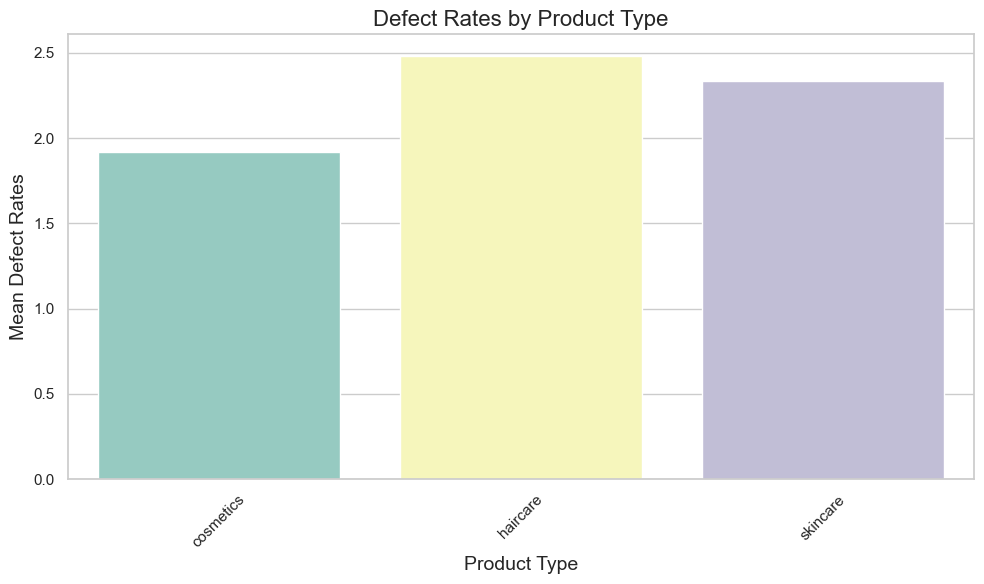

In [13]:
# Assuming supply_data is already defined and contains the necessary data
defect_rates_by_product = df.groupby("Product type")['Defect rates'].mean().reset_index()

# Set the style and color palette
sns.set(style="whitegrid")
color_palette = sns.color_palette("Set3")  # You can choose a different color palette

# Create the bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(data=defect_rates_by_product, x='Product type', y='Defect rates', palette=color_palette)

# Customize the appearance of the plot
barplot.set_title('Defect Rates by Product Type', fontsize=16)
barplot.set_xlabel('Product Type', fontsize=14)
barplot.set_ylabel('Mean Defect Rates', fontsize=14)


# Rotate x-axis labels if necessary
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

# Risk assesment

In [15]:

risk_data = df[['SKU', 'Lead times', 'Stock levels']]
risk_data.head()

,SKU,Lead times,Stock levels
0,SKU0,7,58
1,SKU1,30,53
2,SKU2,10,1
3,SKU3,13,23
4,SKU4,3,5


In [16]:
risk_data['Risk score'] = risk_data['Lead times'] * (1-risk_data.loc[:,'Stock levels'])

In [20]:
import plotly.express as px
# Sort the risk_data by 'Risk score' in descending order and select top 10 highest-risk data
risk_data = risk_data.sort_values(by='Risk score', ascending=False)[:10]

# Create a bar plot using Plotly Express
fig = px.bar(risk_data, x='SKU', y='Risk score', title='Top 10 Highest-Risk Data',
             labels={'Risk score': 'Risk Score', 'SKU': 'SKU'},
             text='Risk score')

# Customize the appearance of the plot
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(xaxis_title='SKU', yaxis_title='Risk Score', title_x=0.5)

# Show the plot
fig.show()

# Inventory Optimization Analysis with EOQ

In [21]:
# we assume for holding cost 0.2
holdingcost = 0.2

In [22]:
import numpy as np

def calculate_eoq(data):
    S = data['Costs']
    D = data['Number of products sold'] 
    H = data['Number of products sold'] * holdingcost
    EOQ = np.sqrt((2*S*D)/H)
    return round(EOQ)

In [23]:
supply_data['EOQ'] = calculate_eoq(supply_data)

In [24]:
comparison_columns = supply_data[['SKU', 'EOQ','Order quantities']]
comparison_columns.head()

,SKU,EOQ,Order quantities
0,SKU0,43.0,96
1,SKU1,71.0,37
2,SKU2,38.0,88
3,SKU3,50.0,59
4,SKU4,96.0,56


In [25]:
# Extracting the top 10 rows for comparison
top_10_comparison = comparison_columns.head(10)

# Creating a bar plot to compare EOQ and Order Quantities for the top 10 SKUs
fig = px.bar(top_10_comparison, x='SKU', y=['EOQ', 'Order quantities'], 
             title='Comparison of EOQ and Order Quantities for Top 10 SKUs')

fig.update_layout(
    title_x=0.5
)

# Displaying the plot
fig.show()

# Customer segmentation analysis

In [27]:
revenue_avg_by_demo_prod = supply_data.groupby(['Customer demographics', 'Product type'])['Revenue generated'].mean().reset_index()
revenue_sum_by_demo_prod = supply_data.groupby(['Customer demographics', 'Product type'])['Revenue generated'].sum().reset_index()

In [28]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a palette of different colors for each product type
colors = px.colors.qualitative.Set3

# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=('Average Revenue', 'Total Revenue'))

# Plot for average revenue
for i, product_type in enumerate(revenue_avg_by_demo_prod['Product type'].unique()):
    subset = revenue_avg_by_demo_prod[revenue_avg_by_demo_prod['Product type'] == product_type]
    fig.add_trace(
        go.Bar(
            x=subset['Customer demographics'],
            y=subset['Revenue generated'],
            name=product_type,
            marker_color=colors[i]
        ),
        row=1, col=1
    )

# Plot for total revenue without legend
for i, product_type in enumerate(revenue_sum_by_demo_prod['Product type'].unique()):
    subset = revenue_sum_by_demo_prod[revenue_sum_by_demo_prod['Product type'] == product_type]
    fig.add_trace(
        go.Bar(
            x=subset['Customer demographics'],
            y=subset['Revenue generated'],
            showlegend=False,  # Hide legend for this subplot
            marker_color=colors[i]
        ),
        row=1, col=2
    )

# Beautify the subplot and show the legend for the first subplot
fig.update_layout(
    title='Revenue Analysis by Customer Demographics and Product Type',
    xaxis=dict(title='Customer Demographics'),
    yaxis=dict(title='Revenue'),
    xaxis2=dict(title='Customer Demographics'),
    yaxis2=dict(title='Revenue'),
    title_x=0.5,
    showlegend=True  # Show legend for the first subplot
)

# Show the subplot
fig.show()

# Lead times optimization analysis

In [29]:
avg_lead_times_transport = supply_data.groupby(['Transportation modes'])['Lead times'].mean().reset_index()

fig = px.bar(avg_lead_times_transport, x='Transportation modes', y='Lead times',
             labels={'Transportation modes': 'Transportation Mode', 'Lead times': 'Average Lead Time'},
             title='Average Lead Times by Transportation Mode')

# Customize the color scale for bars
color_scale = px.colors.qualitative.Set3  # You can choose a different color scale
fig.update_traces(marker_color=color_scale)

# Customize the layout for beautification
fig.update_layout(
    title=dict(text='Average Lead Times by Transportation Mode', x=0.5),
    xaxis_title='Transportation Mode',
    yaxis_title='Average Lead Time',
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    font=dict(family="Arial", size=14),
    showlegend=False  # Remove legend
)

# Show the plot
fig.show()

In [30]:
best_transportation_mode = avg_lead_times_transport.loc[avg_lead_times_transport['Lead times'].idxmin()]
best_transportation_mode

Transportation modes          Sea
Lead times              12.176471
Name: 3, dtype: object

In [31]:
best_transportation_data = supply_data[supply_data['Transportation modes']==best_transportation_mode['Transportation modes']]
best_transportation_data.head()

,Product type,SKU,Price,Availability,Number of products sold,Revenue generated,Customer demographics,Stock levels,Lead times,Order quantities,...,Lead time,Production volumes,Manufacturing lead time,Manufacturing costs,Inspection results,Defect rates,Transportation modes,Routes,Costs,EOQ
6,skincare,SKU6,4.078333,48,65,7823.476560,Male,11,15,58,...,14,314,24,1.085069,Pending,1.000911,Sea,Route A,134.369097,37.0
8,cosmetics,SKU8,68.717597,78,150,7517.363211,Female,5,10,15,...,13,769,8,11.423027,Pending,2.709863,Sea,Route B,505.557134,71.0
15,skincare,SKU15,36.989245,94,469,5442.086785,Non-binary,9,8,69,...,14,580,7,97.121282,Pass,2.264406,Sea,Route B,127.861800,36.0
18,haircare,SKU18,36.443628,23,620,9364.673505,Unknown,10,10,46,...,18,374,17,27.107981,Pending,2.231939,Sea,Route A,593.480259,77.0
27,cosmetics,SKU27,92.557361,42,352,2686.457224,Unknown,47,9,62,...,25,291,4,10.528245,Fail,2.864668,Sea,Route B,762.459182,87.0


In [32]:
import plotly.express as px

avg_lead_times_route = supply_data.groupby(['Routes'])['Lead times'].mean().reset_index()

# Assuming you have the avg_lead_times_route DataFrame already defined
fig = px.bar(avg_lead_times_route, x='Routes', y='Lead times',
             labels={'Routes': 'Route', 'Lead times': 'Average Lead Time'},
             title='Average Lead Times by Route')

# Customize the color scale for bars
color_scale = px.colors.qualitative.Set3  # You can choose a different color scale
fig.update_traces(marker_color=color_scale)

# Customize the layout for beautification
fig.update_layout(
    title=dict(text='Average Lead Times by Route', x=0.5),
    xaxis_title='Route',
    yaxis_title='Average Lead Time',
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    font=dict(family="Arial", size=14),
    showlegend=False  # Remove legend
)

# Show the plot
fig.show()

In [33]:
best_route = avg_lead_times_route.loc[avg_lead_times_route['Lead times'].idxmin()]
best_route

Routes          Route A
Lead times    14.697674
Name: 0, dtype: object

In [34]:
best_route_data = supply_data[supply_data['Routes']==best_route['Routes']]
best_route_data.head()

,Product type,SKU,Price,Availability,Number of products sold,Revenue generated,Customer demographics,Stock levels,Lead times,Order quantities,...,Lead time,Production volumes,Manufacturing lead time,Manufacturing costs,Inspection results,Defect rates,Transportation modes,Routes,Costs,EOQ
3,skincare,SKU3,61.163343,68,83,7766.836426,Non-binary,23,13,59,...,24,937,18,35.624741,Fail,4.746649,Rail,Route A,254.776159,50.0
4,skincare,SKU4,4.805496,26,871,2686.505152,Non-binary,5,3,56,...,5,414,3,92.065161,Fail,3.145580,Air,Route A,923.440632,96.0
5,haircare,SKU5,1.699976,87,147,2828.348746,Non-binary,90,27,66,...,10,104,17,56.766476,Fail,2.779194,Road,Route A,235.461237,49.0
6,skincare,SKU6,4.078333,48,65,7823.476560,Male,11,15,58,...,14,314,24,1.085069,Pending,1.000911,Sea,Route A,134.369097,37.0
11,skincare,SKU11,90.635460,95,960,6099.944116,Female,46,23,60,...,28,362,11,27.592363,Pending,0.021170,Air,Route A,126.723033,36.0


# Modelling

### Forecasting demand

In [37]:
X = supply_data.loc[:,['Price', 'Availability', 'Stock levels', 'Lead times', 'Order quantities']]
y = supply_data.loc[:,'Number of products sold']

In [38]:
# Define the number of folds for cross-validation
num_folds = 10

In [39]:
# Initialize lists to store evaluation metrics
mse_scores = []
rmse_scores = []
mae_scores = []
r2_scores = []

In [40]:
from sklearn.model_selection import KFold

# Create a KFold object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [41]:
# Define the parameters for LightGBM
params = {
    'objective': 'regression',
    'metric': 'mean_squared_error',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9
}

# Cost optimization

In [50]:
# Extract the features (X) and target (y)
X = supply_data.loc[:, 'Production volumes'].values.reshape(-1, 1)
y = supply_data.loc[:, 'Manufacturing costs'].values

In [51]:
# Define the number of folds for cross-validation
num_folds = 5

In [52]:
# Initialize lists to store evaluation metrics
mse_scores = []
rmse_scores = []
mae_scores = []
r2_scores = []

In [53]:
from sklearn.preprocessing import MinMaxScaler

# Initialize and fit the scaler to the data
scaler = MinMaxScaler()
scaler.fit(X)

MinMaxScaler()

In [54]:
# Create a KFold object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [55]:
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Scale the data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define and compile the neural network model
    model = tf.keras.Sequential([
        Dense(64, activation='relu', input_dim=1),
        Dense(32, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Define Early Stopping callback
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Define Model Checkpoint callback to save the best model
    model_checkpoint = ModelCheckpoint('/kaggle/working/best_model.h5', save_best_only=True, save_weights_only=True, monitor='val_loss', mode='min')

    # Train the model on the training data with callbacks
    history = model.fit(X_train_scaled,
                        y_train, epochs=100,
                        batch_size=32,
                        validation_data=(X_test_scaled, y_test),
                        callbacks=[early_stopping, model_checkpoint])

    # Load the best model weights from the saved checkpoint
    model.load_weights('/kaggle/working/best_model.h5')
    
    # Make predictions on the test set
    y_pred = model.predict(X_test_scaled)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = np.mean(np.abs(y_test - y_pred))
    r2 = r2_score(y_test, y_pred)

    # Calculate metrics as percentages
    target_range = np.max(y_test) - np.min(y_test)
    percentage_mse = (mse / target_range) * 100
    percentage_rmse = (rmse / target_range) * 100
    percentage_mae = (mae / target_range) * 100
    percentage_r2 = (r2 * 100)

    # Append the scores to the respective lists
    mse_scores.append(percentage_mse)
    rmse_scores.append(percentage_rmse)
    mae_scores.append(percentage_mae)
    r2_scores.append(percentage_r2)

ValueError: When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5` (Keras weights format). Received: filepath=/kaggle/working/best_model.h5

In [ ]:
# Calculate the average scores over all folds
avg_mse = np.mean(mse_scores)
avg_rmse = np.mean(rmse_scores)
avg_mae = np.mean(mae_scores)
avg_r2 = np.mean(r2_scores)

# Print the results
print(f"Average Mean Squared Error: {avg_mse:.2f}%")
print(f"Average Root Mean Squared Error: {avg_rmse:.2f}%")
print(f"Average Mean Absolute Error: {avg_mae:.2f}%")
print(f"Average R-squared: {avg_r2:.2f}%")

In [56]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# Initialize lists to store scores
mse_scores = []
rmse_scores = []
mae_scores = []
r2_scores = []

# Example data (replace with actual data)
X = np.random.rand(100, 5)  # Replace with your data
y = np.random.rand(100)     # Replace with your data

# Initialize the scaler
scaler = StandardScaler()
scaler.fit(X)

# Define the K-fold cross-validator
kf = KFold(n_splits=5)

# Loop through the K folds
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Scale the data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Define and compile the neural network model
    model = tf.keras.Sequential([
        Dense(64, activation='relu', input_dim=X.shape[1]),
        Dense(32, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # Define Early Stopping callback
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Define Model Checkpoint callback to save the best model
    model_checkpoint = ModelCheckpoint('/kaggle/working/best_model.weights.h5', save_best_only=True, save_weights_only=True, monitor='val_loss', mode='min')

    # Train the model on the training data with callbacks
    history = model.fit(X_train_scaled,
                        y_train, epochs=100,
                        batch_size=32,
                        validation_data=(X_test_scaled, y_test),
                        callbacks=[early_stopping, model_checkpoint])

    # Load the best model weights from the saved checkpoint
    model.load_weights('/kaggle/working/best_model.weights.h5')
    
    # Make predictions on the test set
    y_pred = model.predict(X_test_scaled)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = np.mean(np.abs(y_test - y_pred))
    r2 = r2_score(y_test, y_pred)

    # Calculate metrics as percentages
    target_range = np.max(y_test) - np.min(y_test)
    percentage_mse = (mse / target_range) * 100
    percentage_rmse = (rmse / target_range) * 100
    percentage_mae = (mae / target_range) * 100
    percentage_r2 = (r2 * 100)

    # Append the scores to the respective lists
    mse_scores.append(percentage_mse)
    rmse_scores.append(percentage_rmse)
    mae_scores.append(percentage_mae)
    r2_scores.append(percentage_r2)

# Print the average scores
print(f'Average MSE (%): {np.mean(mse_scores)}')
print(f'Average RMSE (%): {np.mean(rmse_scores)}')
print(f'Average MAE (%): {np.mean(mae_scores)}')
print(f'Average R2 (%): {np.mean(r2_scores)}')


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3108 - val_loss: 0.2776
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2177 - val_loss: 0.2053
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.1651 - val_loss: 0.1680
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1340 - val_loss: 0.1572
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1153 - val_loss: 0.1569
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1105 - val_loss: 0.1604
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1003 - val_loss: 0.1615
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0982 - val_loss: 0.1587
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0897 - val_loss: 0.1537
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0860 - val_loss: 0.1488
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0878 - val_loss: 0.1462
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0837 - val_lo

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0494 - val_loss: 0.0770
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.5493 - val_loss: 0.2625
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3135 - val_loss: 0.1593
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.2150 - val_loss: 0.1055
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.1408 - val_loss: 0.0896
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1327 - val_loss: 0.0951
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1254 - val_loss: 0.1045
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1145 - val_loss: 0.1085
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1104 - val_loss: 0.1062
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1056 - val_loss: 0.1009
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.5898 - val_loss: 0.5624
Epoch 2/100
3

Epoch 59/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0413 - val_loss: 0.1136
Epoch 60/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0367 - val_loss: 0.1138
Epoch 61/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0384 - val_loss: 0.1137
Epoch 62/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0421 - val_loss: 0.1138
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1695 - val_loss: 0.1964
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.1283 - val_loss: 0.1676
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1044 - val_loss: 0.1562
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0976 - val_loss: 0.1516
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0845 - val_loss: 0.1485
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0812 - val_loss: 0.1435
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0854 - val_loss: 0.1389
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━

In [62]:
from sklearn.preprocessing import StandardScaler

# Assuming supply_data contains all the necessary features including 'Production volumes'
relevant_features = ['Production volumes', 'Price', 'Availability', 'Number of products sold', 'Defect rates']  # Adjust feature names accordingly

# Select relevant features
relevant_data = supply_data[relevant_features]

# Initialize and fit the StandardScaler with relevant features
scaler = StandardScaler()
scaler.fit(relevant_data)

min_production_volume = relevant_data['Production volumes'].min()
max_production_volume = 1000
step_size = 100

cheapest_cost = float('inf')
best_production_volume = None

for production_volume in range(min_production_volume, max_production_volume + 1, step_size):
    # Normalize all relevant features, including production volume
    normalized_features = scaler.transform(np.array([[production_volume, 0, 0, 0, 0]]))  # Replace 0 with values for other features if available

    # Predict the cost using the trained model
    predicted_cost = model.predict(normalized_features)

    if predicted_cost[0][0] < cheapest_cost:
        cheapest_cost = predicted_cost[0][0]
        best_production_volume = production_volume

print('Most optimal production volume to minimize manufacturing cost:', best_production_volume)
print('The cheapest manufacturing cost:', cheapest_cost)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Most optimal production volume to minimize manufacturing cost: 904
The cheapest manufacturing cost: 0.72348124


# Visualizations

In [63]:
df.columns

Index(['Product type', 'SKU', 'Price', 'Availability',
       'Number of products sold', 'Revenue generated', 'Customer demographics',
       'Stock levels', 'Lead times', 'Order quantities', 'Shipping times',
       'Shipping carriers', 'Shipping costs', 'Supplier name', 'Location',
       'Lead time', 'Production volumes', 'Manufacturing lead time',
       'Manufacturing costs', 'Inspection results', 'Defect rates',
       'Transportation modes', 'Routes', 'Costs'],
      dtype='object')

In [75]:
df1 = df.groupby('Location')['Number of products sold'].sum().sort_values(ascending = False)

### Location wise No of products Sold

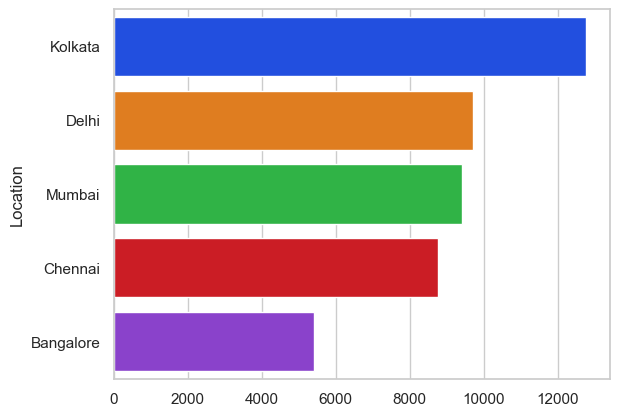

In [78]:
sns.barplot(x = df1.values, y  =df1.index, palette = 'bright')
plt.show()

## Customer demographics distribution

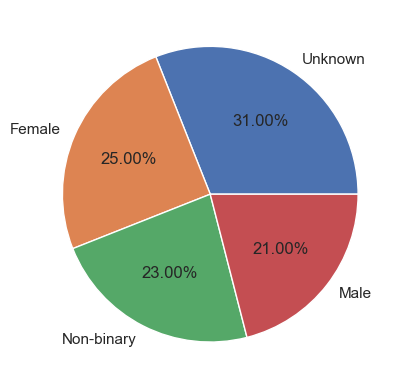

In [87]:
df['Customer demographics'].value_counts().plot(kind = 'pie', autopct =  '%1.2f%%')
plt.ylabel(None)
plt.show()

## Location wise No of Orders sorted by Product type

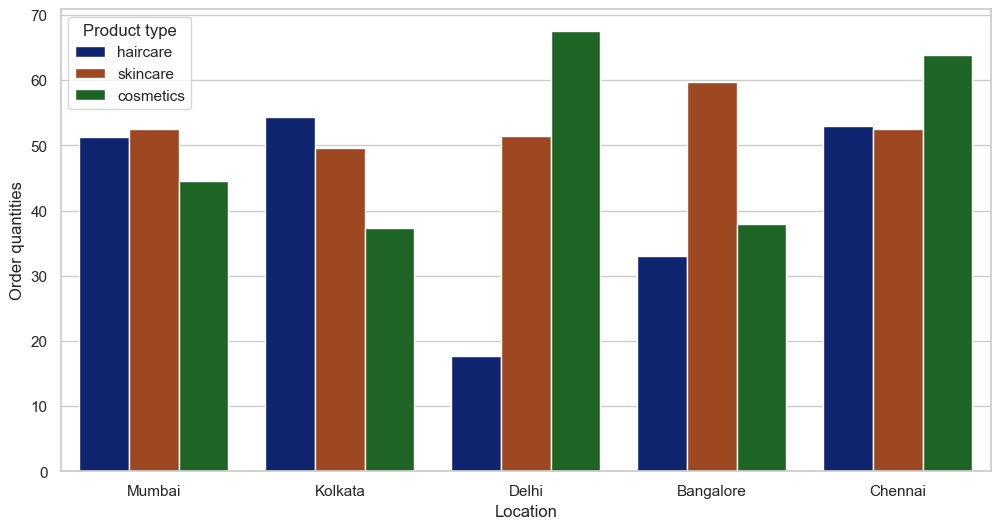

In [93]:
plt.figure(figsize=(12,6))
sns.barplot(x = 'Location' , y = 'Order quantities', data =df, hue = 'Product type', ci = None, palette = 'dark')
plt.show()

## Manufacturing costs wrt Product Types

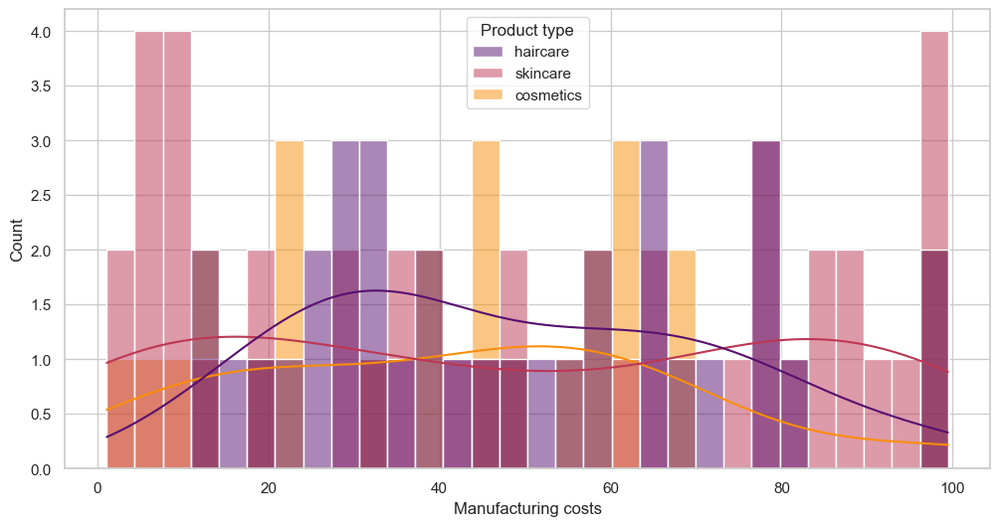

In [113]:
plt.figure(figsize=(12,6))
sns.histplot(x ='Manufacturing costs', data =df , bins = 30, kde = True, hue = 'Product type', palette = 'inferno')
plt.show()

## Shipping wrt to different tranposration modes

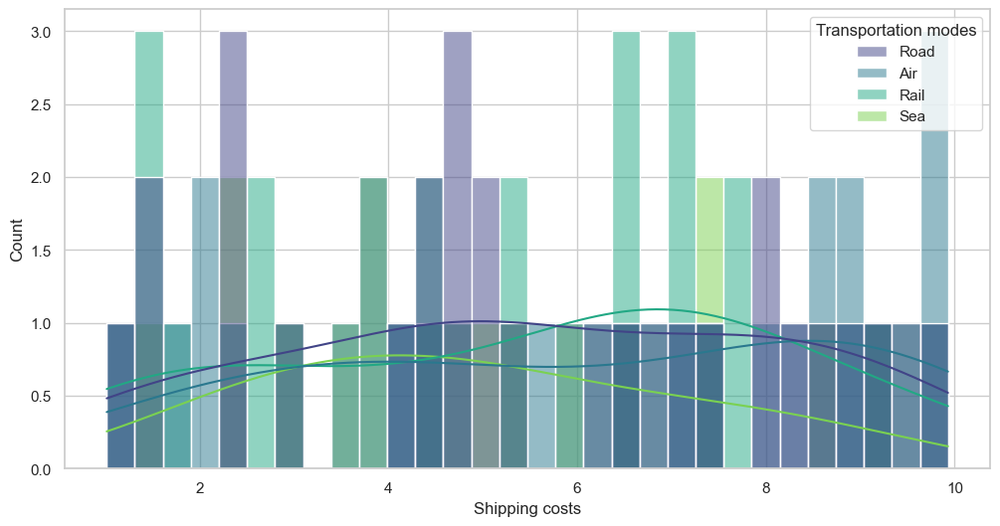

In [118]:
plt.figure(figsize=(12,6))
sns.histplot(x ='Shipping costs', data =df , bins = 30, kde = True, hue = 'Transportation modes', palette = 'viridis')
plt.show()